In [49]:
try:
    # Essential imports
    import re
    import os
    import sys
    import json
    import glob
    import torch
    import shutil
    import random
    import torch.nn as nn
    import logging
    import rasterio
    import numpy as np
    import pandas as pd
    import seaborn as sns
    import geopandas as gpd
    import matplotlib.pyplot as plt
    from collections import Counter
    from PIL import Image
    from datetime import datetime
    from pathlib import Path
    from scipy import stats
    from typing import Dict, Tuple, Optional
    from collections import defaultdict
    from rasterio import plot
    from rasterio.mask import mask
    from shapely.ops import unary_union
    from shapely.wkt import dumps, loads
    from shapely.geometry import mapping, box, Polygon, MultiPolygon
    from rasterio.windows import from_bounds, bounds as window_bounds
    from s2cloudless import S2PixelCloudDetector
    from tqdm import tqdm
    from tqdm.notebook import tqdm
    from sklearn.model_selection import TimeSeriesSplit
except Exception as e:
    print(f"Error : {e}")

In [50]:
# Create project directory structure
project_dir = Path("../")
subdirs = [
    "../Datasets/Sentinel-2/",           # Original GeoJSON and Sentinel-2 data
    "../Datasets/Testing/Processed",     # Processed and grouped events
    "../Datasets/Testing/Samples",       # Our sampled datasets
    "../Datasets/Testing/Tiles",         # Generated image tiles
    "../Docs/Diagrams",                             # Results and visualizations
    "../Models",                                    # Trained models
    "../Docs/Logs"                                  # Processing logs
]

# Create directories if they don't exist
for subdir in subdirs:
    Path(subdir).mkdir(parents=True, exist_ok=True)

# Set up logging
logging.basicConfig(
    filename=Path("../Docs/Logs/experiment.log"),
    level=logging.INFO,
    format='%(asctime)s - %(levelname)s - %(message)s'
)

# Print created directory structure for verification
print("Created directory structure:")
for subdir in subdirs:
    if Path(subdir).exists():
        print(f"✓ {subdir}")
    else:
        print(f"✗ {subdir}")

Created directory structure:
✓ ../Datasets/Sentinel-2/
✓ ../Datasets/Testing/Processed
✓ ../Datasets/Testing/Samples
✓ ../Datasets/Testing/Tiles
✓ ../Docs/Diagrams
✓ ../Models
✓ ../Docs/Logs


In [51]:
# Print the PyTorch version
print(f"PyTorch version: {torch.__version__}")

# Check if running in Google Colab
if "google.colab" in str(get_ipython()):
    if torch.cuda.is_available():
        device = "cuda"
    else:
        device = 'cpu'
        print("GPU not available in Colab, consider enabling a GPU runtime.")
# Running on a local machine
else:
    if torch.backends.mps.is_available():
        device = 'mps'
        print(f"Is Apple MPS (Metal Performance Shader) built? {torch.backends.mps.is_built()}")
        print(f"Is Apple MPS available? {torch.backends.mps.is_available()}")
    elif torch.cuda.is_available():
        device = 'cuda'
    else:
        device = 'cpu'

# TODO: Add support for AMD ROCm GPU if needed

# Print the device being used
print(f"Using device: {device}")

PyTorch version: 2.6.0.dev20241112
Is Apple MPS (Metal Performance Shader) built? True
Is Apple MPS available? True
Using device: mps


In [52]:
# Set the path to the GeoJSON file
base_path = Path('../Datasets/Sentinel-2')
geojson_path = Path('../Datasets/BoundingBox/deforestation.geojson')
test_geojson_path = Path('../Datasets/BoundingBox/bbox.geojson')
safe_dirs = list(base_path.glob("*/*.SAFE"))

In [53]:
# Load the GeoJSON file
gdf = gpd.read_file(test_geojson_path)

# Display GeoJSON information
print("GeoJSON Information:", len(gdf))
print("-" * 50)
print(gdf.info())
print("\nFirst few records:")
print(gdf.head())

# Get the bounding box coordinates
bbox = gdf.total_bounds
print("\nBounding Box (minx, miny, maxx, maxy):")
print(bbox)

# Display basic information about the GeoJSON
print("\nGeoJSON CRS:", gdf.crs)
print("Number of features:", len(gdf))
print("Columns:", gdf.columns.tolist())
print("First geometry type:", gdf.geometry.iloc[0].geom_type)

GeoJSON Information: 104
--------------------------------------------------
<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 104 entries, 0 to 103
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   id        104 non-null    object  
 1   code      104 non-null    object  
 2   status    104 non-null    object  
 3   geometry  104 non-null    geometry
dtypes: geometry(1), object(3)
memory usage: 3.4+ KB
None

First few records:
                     id   code     status  \
0  08FA09827D3407E9160C  PLOT1  Converted   
1  0F575A80C63407FAABC3  PLOT2  Converted   
2  083ADD85553407FB16F6  PLOT3  Converted   
3  04B6955BE53407FC6E55  PLOT4  Converted   
4  0D7B4BAA923407FDF1AA  PLOT5  Converted   

                                            geometry  
0  POLYGON Z ((76.37335 9.98234 0, 76.37346 9.983...  
1  POLYGON Z ((76.36157 10.05934 0, 76.36113 10.0...  
2  POLYGON Z ((76.35741 10.05451 0, 76.35765 10.0...  
3  

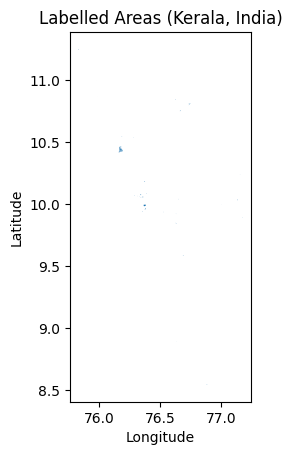

In [54]:
# Plot the geospatial data
gdf.plot()
plt.title('Labelled Areas (Kerala, India)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [55]:
# Load the GeoJSON file for the project
del gdf
gdf = gpd.read_file(geojson_path)

# Display GeoJSON information
print("GeoJSON Information:", len(gdf))
print("-" * 50)
print(gdf.info())
print("\nFirst few records:")
print(gdf.head())

# Get the bounding box coordinates
bbox = gdf.total_bounds
print("\nBounding Box (minx, miny, maxx, maxy):")
print(bbox)

# Display basic information about the GeoJSON
print("\nGeoJSON CRS:", gdf.crs)
print("Number of features:", len(gdf))
print("Columns:", gdf.columns.tolist())
print("First geometry type:", gdf.geometry.iloc[0].geom_type)

GeoJSON Information: 5696
--------------------------------------------------
<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 5696 entries, 0 to 5695
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   img_date  5696 non-null   datetime64[ms]
 1   tile      5696 non-null   object        
 2   geometry  5696 non-null   geometry      
dtypes: datetime64[ms](1), geometry(1), object(1)
memory usage: 133.6+ KB
None

First few records:
    img_date   tile                                           geometry
0 2016-04-09  36UXA  POLYGON ((35.7913 50.17406, 35.79277 50.17354,...
1 2016-04-09  36UXA  POLYGON ((35.77653 50.10271, 35.7781 50.10318,...
2 2016-04-09  36UXA  POLYGON ((35.78621 50.01277, 35.78616 50.01369...
3 2016-04-09  36UXA  POLYGON ((35.78007 50.00556, 35.78189 50.00557...
4 2016-04-09  36UXA  POLYGON ((35.79781 49.99568, 35.79908 49.99582...

Bounding Box (minx, miny, maxx, maxy):
[34.37579618 4

In [56]:
# Ensure 'img_date' is in datetime format if it exists
if 'img_date' in gdf.columns:
    gdf['img_date'] = pd.to_datetime(gdf['img_date'], errors='coerce')

    # Drop rows with invalid dates if any
    gdf = gdf.dropna(subset=['img_date'])

    # Get unique dates and sort them
    unique_dates = gdf['img_date'].dt.date.unique()
    unique_dates.sort()

    date_counts = gdf['img_date'].dt.date.value_counts().sort_index()
    print("Occurrences of each 'img_date':")
    print(date_counts)
else:
    print("'img_date' column not found in the GeoDataFrame.")

Occurrences of each 'img_date':
img_date
2016-01-03    3122
2016-02-12       6
2016-04-09      10
2016-05-22       2
2016-06-18       2
              ... 
2019-08-25      34
2019-08-30      49
2019-09-04      20
2019-09-09      34
2019-10-26       2
Name: count, Length: 93, dtype: int64


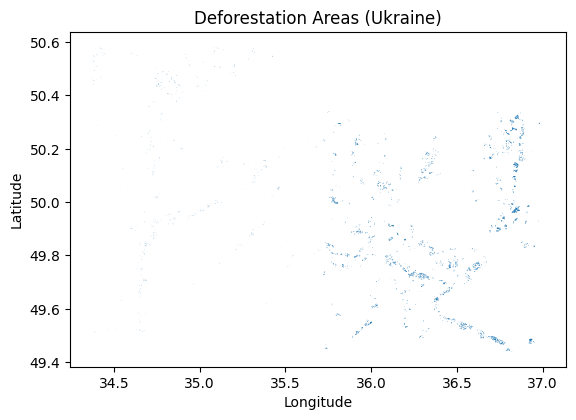

In [57]:
# Plot the geospatial data
gdf.plot()
plt.title('Deforestation Areas (Ukraine)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

Deforestation events by year and month:
month    1    2    3    4   5    6    7    8    9   10  11  12
year                                                          
2016   3122    6    0   10   2   34   40   56    0  28   2  18
2017      0    2    0    0   0    0    0   13   55  17  86   0
2018     47  113   45   86  50  217  169  480  117   0   0   0
2019      0    2  227  240  34  127   59  136   54   2   0   0

Deforestation events by tile:
tile
36UYA    3836
36UXA    1860
Name: count, dtype: int64


<Figure size 1200x600 with 0 Axes>

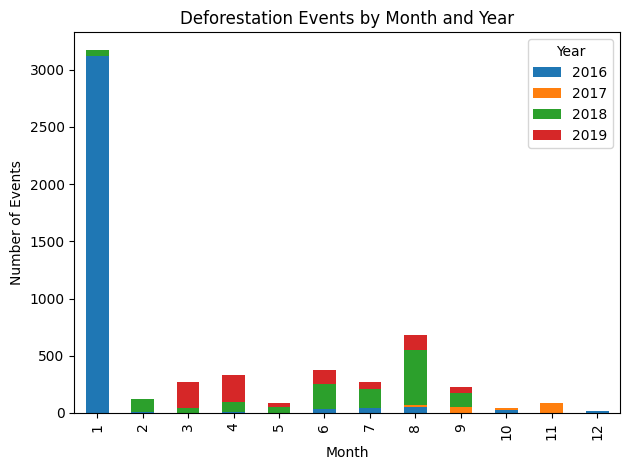

In [58]:
# Analyze temporal distribution
gdf['year'] = gdf['img_date'].dt.year
gdf['month'] = gdf['img_date'].dt.month

# Create year-month summary
temporal_dist = gdf.groupby(['year', 'month']).size().unstack(fill_value=0)
print("Deforestation events by year and month:")
print(temporal_dist)

# Distribution by tile
print("\nDeforestation events by tile:")
print(gdf['tile'].value_counts())

# Create a monthly summary plot
plt.figure(figsize=(12, 6))
temporal_dist.T.plot(kind='bar', stacked=True)
plt.title('Deforestation Events by Month and Year')
plt.xlabel('Month')
plt.ylabel('Number of Events')
plt.legend(title='Year')
plt.tight_layout()
plt.show()

Polygon area statistics (square meters):
count      5696.000000
mean      23828.175152
std       39181.583379
min          14.886777
25%        3077.146952
50%       12729.240210
75%       29412.436905
max      673010.440216
Name: area, dtype: float64


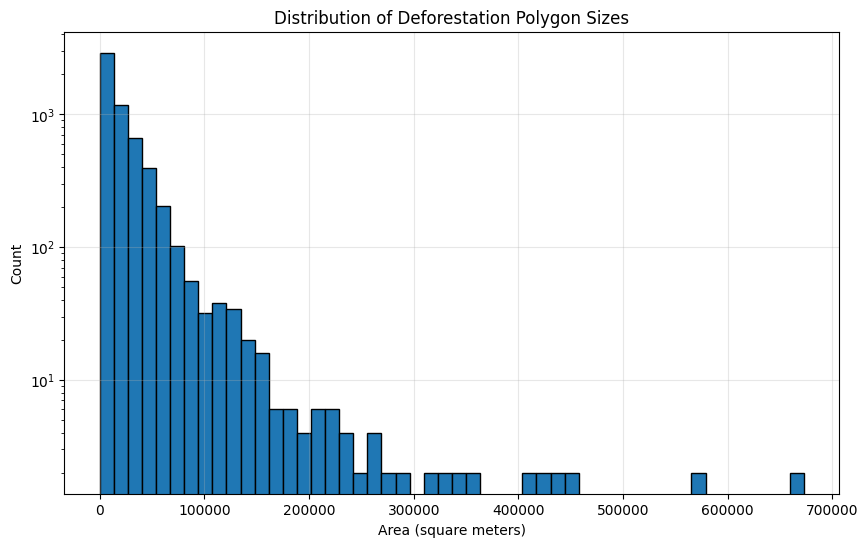

Shape complexity statistics (1.0 = perfect square):
count    5696.000000
mean        1.235697
std         0.254916
min         0.907842
25%         1.054823
50%         1.162195
75%         1.338896
max         3.089062
Name: complexity, dtype: float64


In [59]:
# Calculate area of each polygon in square meters
# Converting to UTM projection for accurate area and perimeter calculation
gdf['area'] = gdf.geometry.to_crs({'proj':'utm', 'zone':36, 'ellps':'WGS84'}).area
gdf['perimeter'] = gdf.geometry.to_crs({'proj':'utm', 'zone':36, 'ellps':'WGS84'}).length

# Basic statistics of polygon sizes
print("Polygon area statistics (square meters):")
print(gdf['area'].describe())

# Create histogram of polygon sizes
plt.figure(figsize=(10, 6))
plt.hist(gdf['area'], bins=50, edgecolor='black')
plt.title('Distribution of Deforestation Polygon Sizes')
plt.xlabel('Area (square meters)')
plt.ylabel('Count')
plt.yscale('log')  # Using log scale for better visualization
plt.grid(True, alpha=0.3)
plt.show()

# Calculate basic shape metrics
gdf['complexity'] = gdf['perimeter'] / (4 * np.sqrt(gdf['area']))

print("Shape complexity statistics (1.0 = perfect square):")
print(gdf['complexity'].describe())

In [60]:
# Reproject to UTM Zone 36N
deforestation_data_utm = gdf.to_crs(epsg=32636)

# Recalculate statistics in UTM projection
polygon_areas = deforestation_data_utm.geometry.area  # now in square meters
polygon_bounds = deforestation_data_utm.geometry.bounds

# Calculate statistics
max_width = (polygon_bounds.maxx - polygon_bounds.minx).max()
max_height = (polygon_bounds.maxy - polygon_bounds.miny).max()
mean_area = polygon_areas.mean()
median_area = polygon_areas.median()

print(f"Polygon Statistics:")
print(f"Mean area: {mean_area/10000:.2f} hectares")
print(f"Median area: {median_area/10000:.2f} hectares")
print(f"Max width: {max_width:.2f} meters")
print(f"Max height: {max_height:.2f} meters")

# Calculate optimal mesh size based on polygon distribution
hist, bins = np.histogram(polygon_areas, bins=20)
print("\nArea Distribution (hectares):")
for i in range(len(hist)):
    if hist[i] > 0:
        print(f"{bins[i]/10000:.2f} - {bins[i+1]/10000:.2f}: {hist[i]} polygons")

# Additional useful statistics
print("\nAdditional Statistics:")
print(f"Total number of polygons: {len(deforestation_data_utm)}")
print(f"Total area of deforestation: {polygon_areas.sum()/10000:.2f} hectares")
print(f"95th percentile area: {np.percentile(polygon_areas, 95)/10000:.2f} hectares")

Polygon Statistics:
Mean area: 2.38 hectares
Median area: 1.27 hectares
Max width: 1634.66 meters
Max height: 1399.53 meters

Area Distribution (hectares):
0.00 - 3.37: 4557 polygons
3.37 - 6.73: 779 polygons
6.73 - 10.10: 174 polygons
10.10 - 13.46: 88 polygons
13.46 - 16.83: 38 polygons
16.83 - 20.19: 14 polygons
20.19 - 23.56: 16 polygons
23.56 - 26.92: 6 polygons
26.92 - 30.29: 4 polygons
30.29 - 33.65: 4 polygons
33.65 - 37.02: 4 polygons
40.38 - 43.75: 4 polygons
43.75 - 47.11: 4 polygons
57.21 - 60.57: 2 polygons
63.94 - 67.30: 2 polygons

Additional Statistics:
Total number of polygons: 5696
Total area of deforestation: 13572.53 hectares
95th percentile area: 7.57 hectares


In [61]:
def collect_jp2_files(base_dir):
    jp2_files = []  # Create empty list to store paths
    for root, _, files in os.walk(base_dir):
        for file in files:
            if file.endswith(".jp2"):
                full_path = os.path.join(root, file)
                jp2_files.append(full_path)
    return jp2_files


jp2_files = collect_jp2_files(base_path)

# Print count
print(f"Total files found: {len(jp2_files)}")

# Print random paths
file_path = random.choice(jp2_files)
print(f"Randomly selected file: {file_path}")

Total files found: 750
Randomly selected file: ../Datasets/Sentinel-2/S2A_MSIL1C_20160509T082612_N0202_R021_T36UYA_20160509T083548/S2A_MSIL1C_20160509T082612_N0202_R021_T36UYA_20160509T083548.SAFE/GRANULE/L1C_T36UYA_A004594_20160509T083548/IMG_DATA/T36UYA_20160509T082612_B08.jp2


In [62]:
def data_parser(file_path):
    # Extract filename and directory structure
    path_parts = file_path.split(os.sep)
    
    # Get product name from the first directory in the path containing S2
    product_name = next(part for part in path_parts if part.startswith('S2'))
    
    # Get band information from the filename (last part)
    filename = path_parts[-1]
    band = filename.split('_')[-1].replace('.jp2', '').replace('B', '')
    
    # Split the product name into components
    parts = product_name.split('_')
    
    details = {
        'mission': parts[0],            # S2A or S2B satellite
        'product_level': parts[1],      # Processing level (MSIL1C)
        'sensing_date': parts[2][:8],   # YYYYMMDD
        'sensing_time': parts[2][9:],   # HHMMSS
        'processing_number': parts[3],  # Processing baseline number
        'orbit_number': parts[4],       # Relative orbit number
        'tile_number': parts[5][1:],    # Tile identifier
        'product_date': parts[6][:8],   # Product generation date
        'product_time': parts[6][9:],   # Product generation time
        'band': band,                   # Band number
        'file_path': file_path            # Full file path
    }
    
    # Pretty print the results
    print(f"Mission           : {details['mission']}")
    print(f"Product Level     : {details['product_level']}")
    print(f"Sensing Date      : {details['sensing_date']}")
    print(f"Sensing Time      : {details['sensing_time']}")
    print(f"Processing Number : {details['processing_number']}")
    print(f"Orbit Number      : {details['orbit_number']}")
    print(f"Tile Number       : {details['tile_number']}")
    print(f"Product Date      : {details['product_date']}")
    print(f"Product Time      : {details['product_time']}")
    print(f"Band Number       : {details['band']}")
    print(f"File Path         : {details['file_path']}")

    return details

# Example usage:
file_path = random.choice(jp2_files)
result = data_parser(file_path)

Mission           : S2B
Product Level     : MSIL1C
Sensing Date      : 20190402
Sensing Time      : 083559
Processing Number : N0207
Orbit Number      : R064
Tile Number       : 36UYA
Product Date      : 20190402
Product Time      : 111852
Band Number       : 03
File Path         : ../Datasets/Sentinel-2/S2B_MSIL1C_20190402T083559_N0207_R064_T36UYA_20190402T111852/S2B_MSIL1C_20190402T083559_N0207_R064_T36UYA_20190402T111852.SAFE/GRANULE/L1C_T36UYA_A010815_20190402T083714/IMG_DATA/T36UYA_20190402T083559_B03.jp2


In [63]:
def analyze_sentinel_structure(base_path):
    """
    Analyzes Sentinel-2 dataset structure and returns key information
    
    Args:
        base_path (str): Path to the Sentinel-2 dataset directory
    
    Returns:
        pd.DataFrame: DataFrame containing image metadata
    """
    # Initialize lists to store metadata
    metadata = []
    
    # Convert to Path object
    base = Path(base_path)
    # Pattern for date extraction
    date_pattern = r'(\d{8}T\d{6})'
    
    # Iterate through all .SAFE directories
    for safe_dir in base.glob('*/*.SAFE'):
        # Extract metadata from directory name
        dir_name = safe_dir.parent.name
        
        # Extract date using regex
        date_match = re.search(date_pattern, dir_name)
        if date_match:
            acquisition_date = datetime.strptime(date_match.group(1), '%Y%m%dT%H%M%S')
        else:
            acquisition_date = None
            
        # Get satellite (S2A or S2B)
        satellite = dir_name[:3]
        
        # Get tile ID
        tile_match = re.search(r'T(\d{2}[A-Z]{3})', dir_name)
        tile_id = tile_match.group(1) if tile_match else None
        
        # Count number of bands
        bands = list(safe_dir.glob('GRANULE/*/IMG_DATA/*.jp2'))
        num_bands = len([b for b in bands if not b.name.endswith('TCI.jp2')])
        
        metadata.append({
            'satellite': satellite,
            'acquisition_date': acquisition_date,
            'tile_id': tile_id,
            'num_bands': num_bands,
            'path': safe_dir
        })
    
    # Create DataFrame
    df = pd.DataFrame(metadata)
    df = df.sort_values('acquisition_date')
    
    return df

# Usage example:
df = analyze_sentinel_structure(base_path)

# Display basic statistics
print("Dataset Summary:")
print(f"Total number of images: {len(df)}")
print("\nAcquisitions by satellite:")
print(df['satellite'].value_counts())
print("\nDate range:")
print(f"First acquisition: {df['acquisition_date'].min()}")
print(f"Last acquisition: {df['acquisition_date'].max()}")

# Display the DataFrame
df.head()

Dataset Summary:
Total number of images: 50

Acquisitions by satellite:
satellite
S2A    33
S2B    17
Name: count, dtype: int64

Date range:
First acquisition: 2016-02-12 08:40:52
Last acquisition: 2019-09-09 08:35:59


,satellite,acquisition_date,tile_id,num_bands,path
3,S2A,2016-02-12 08:40:52,36UYA,13,../Datasets/Sentinel-2/S2A_MSIL1C_20160212T084...
33,S2A,2016-03-30 08:25:42,36UYA,13,../Datasets/Sentinel-2/S2A_MSIL1C_20160330T082...
15,S2A,2016-04-05 08:50:12,36UYA,13,../Datasets/Sentinel-2/S2A_MSIL1C_20160405T085...
7,S2A,2016-05-02 08:36:02,36UYA,13,../Datasets/Sentinel-2/S2A_MSIL1C_20160502T083...
14,S2A,2016-05-09 08:26:12,36UYA,13,../Datasets/Sentinel-2/S2A_MSIL1C_20160509T082...


In [64]:
def get_band_statistics(image_path):
    """Get statistics for specific bands in an image"""
    band_paths = Path(image_path).glob('GRANULE/*/IMG_DATA/*.jp2')
    bands = {}
    for band_path in band_paths:
        band_name = re.search(r'B\d{2}|B8A', band_path.name)
        if band_name:
            bands[band_name.group(0)] = str(band_path)
    return dict(sorted(bands.items()))

def get_quality_masks(image_path):
    """Get list of quality masks for an image"""
    mask_paths = Path(image_path).glob('GRANULE/*/QI_DATA/*.gml')
    return [p.name for p in mask_paths]

# Example usage:
image_path = df.iloc[0]['path']
print("Band files in first image:")
for band, path in get_band_statistics(image_path).items():
    print(f"{band}: {path}")

Band files in first image:
B01: ../Datasets/Sentinel-2/S2A_MSIL1C_20160212T084052_N0201_R064_T36UYA_20160212T084510/S2A_MSIL1C_20160212T084052_N0201_R064_T36UYA_20160212T084510.SAFE/GRANULE/L1C_T36UYA_A003350_20160212T084510/IMG_DATA/T36UYA_20160212T084052_B01.jp2
B02: ../Datasets/Sentinel-2/S2A_MSIL1C_20160212T084052_N0201_R064_T36UYA_20160212T084510/S2A_MSIL1C_20160212T084052_N0201_R064_T36UYA_20160212T084510.SAFE/GRANULE/L1C_T36UYA_A003350_20160212T084510/IMG_DATA/T36UYA_20160212T084052_B02.jp2
B03: ../Datasets/Sentinel-2/S2A_MSIL1C_20160212T084052_N0201_R064_T36UYA_20160212T084510/S2A_MSIL1C_20160212T084052_N0201_R064_T36UYA_20160212T084510.SAFE/GRANULE/L1C_T36UYA_A003350_20160212T084510/IMG_DATA/T36UYA_20160212T084052_B03.jp2
B04: ../Datasets/Sentinel-2/S2A_MSIL1C_20160212T084052_N0201_R064_T36UYA_20160212T084510/S2A_MSIL1C_20160212T084052_N0201_R064_T36UYA_20160212T084510.SAFE/GRANULE/L1C_T36UYA_A003350_20160212T084510/IMG_DATA/T36UYA_20160212T084052_B04.jp2
B05: ../Datasets/Sent

In [65]:
# Get the first image directory to analyze bands
first_image = safe_dirs[0]
img_data_path = list((first_image / "GRANULE").glob("*"))[0] / "IMG_DATA"
band_files = list(img_data_path.glob("*.jp2"))

# Extract band information
band_info = []
for band_file in band_files:
    band_name = band_file.name.split('_')[-1].split('.')[0]
    
    # Open the band file to get metadata
    with rasterio.open(band_file) as src:
        band_info.append({
            'band': band_name,
            'width': src.width,
            'height': src.height,
            'dtype': src.dtypes[0],
            'resolution': src.res[0]  # pixel size in meters
        })

# Create DataFrame with band information
df_bands = pd.DataFrame(band_info)
print("Band Information:")
print("-" * 50)
print(df_bands.sort_values('band'))

# Count number of files per image
print("\nNumber of files per image:")
print(len(band_files))

# Print list of unique bands
print("\nAvailable bands:")
unique_bands = sorted(list(df_bands['band'].unique()))
print(unique_bands)

Band Information:
--------------------------------------------------
   band  width  height   dtype  resolution
9   B01   1830    1830  uint16        60.0
7   B02  10980   10980  uint16        10.0
8   B03  10980   10980  uint16        10.0
1   B04  10980   10980  uint16        10.0
2   B05   5490    5490  uint16        20.0
6   B06   5490    5490  uint16        20.0
4   B07   5490    5490  uint16        20.0
10  B08  10980   10980  uint16        10.0
12  B09   1830    1830  uint16        60.0
0   B10   1830    1830  uint16        60.0
3   B11   5490    5490  uint16        20.0
5   B12   5490    5490  uint16        20.0
13  B8A   5490    5490  uint16        20.0
11  TCI  10980   10980   uint8        10.0

Number of files per image:
14

Available bands:
['B01', 'B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B09', 'B10', 'B11', 'B12', 'B8A', 'TCI']


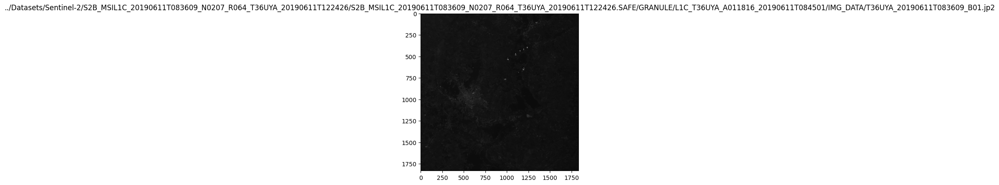

{'driver': 'JP2OpenJPEG', 'dtype': 'uint16', 'nodata': None, 'width': 1830, 'height': 1830, 'count': 1, 'crs': CRS.from_wkt('PROJCS["WGS 84 / UTM zone 36N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",33],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32636"]]'), 'transform': Affine(60.0, 0.0, 699960.0,
       0.0, -60.0, 5600040.0)}


In [66]:
# Get first key
example = jp2_files[9]

def visualize_band(jp2_path):
    with rasterio.open(jp2_path) as src:
        band = src.read(1)  # Read the first band
        plt.imshow(band, cmap="gray")
        plt.title(jp2_path)
        plt.show()

visualize_band(example)

# Open the .jp2 file
with rasterio.open(example) as dataset:
    # Read the dataset's data as a numpy array
    band_data = dataset.read(1)
    # Access metadata
    metadata = dataset.meta

print(metadata)

Dataset Summary:
--------------------------------------------------
Date range: 2016-02-12 08:40:52 to 2019-09-09 08:35:59
Number of unique tiles: 2
Number of satellites: 2

Satellite distribution:
satellite
S2A    33
S2B    17
Name: count, dtype: int64

Tile distribution:
tile_id
T36UYA    38
T36UXA    12
Name: count, dtype: int64


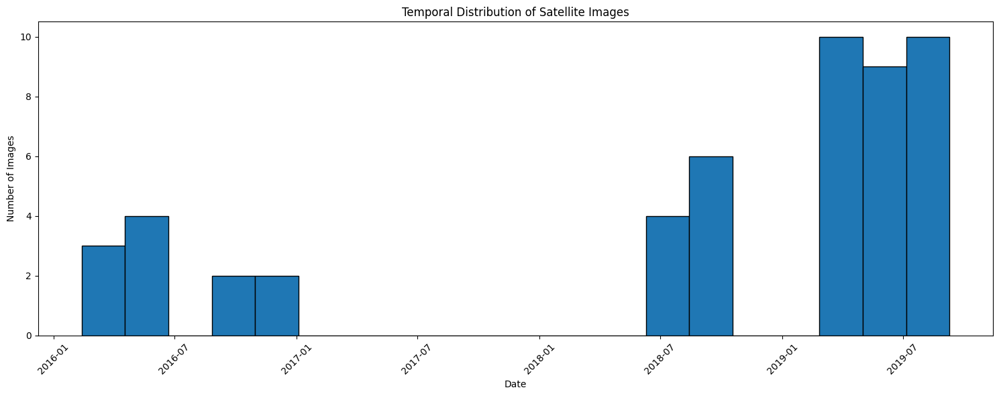

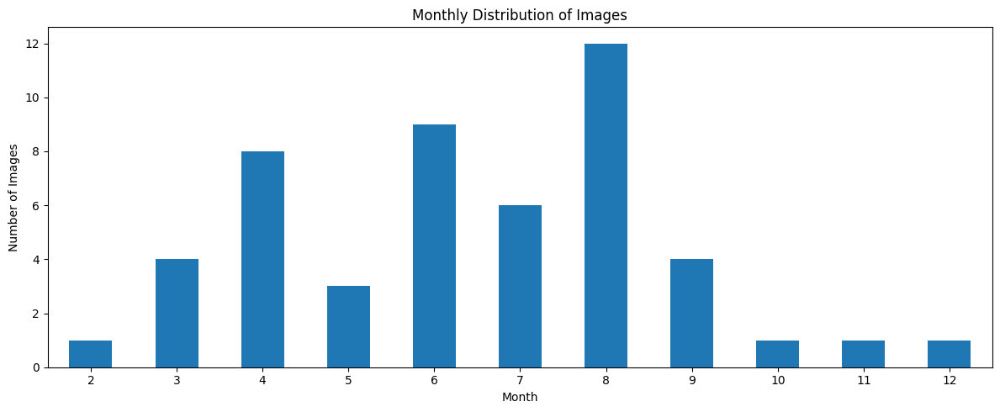

In [67]:
# Create a list to store metadata
metadata_list = []

for safe_dir in safe_dirs:
    # Parse directory name
    dir_parts = safe_dir.name.split('_')
    
    metadata = {
        'satellite': dir_parts[0],  # S2A or S2B
        'processing_level': dir_parts[1],  # MSIL1C
        'timestamp': datetime.strptime(dir_parts[2], '%Y%m%dT%H%M%S'),
        'relative_orbit': dir_parts[4],  # R064
        'tile_id': dir_parts[5],  # T36UYA
        'path': safe_dir
    }
    metadata_list.append(metadata)

# Create DataFrame
df_metadata = pd.DataFrame(metadata_list)

# Basic analysis
print("Dataset Summary:")
print("-" * 50)
print(f"Date range: {df_metadata['timestamp'].min()} to {df_metadata['timestamp'].max()}")
print(f"Number of unique tiles: {df_metadata['tile_id'].nunique()}")
print(f"Number of satellites: {df_metadata['satellite'].nunique()}")
print("\nSatellite distribution:")
print(df_metadata['satellite'].value_counts())
print("\nTile distribution:")
print(df_metadata['tile_id'].value_counts())

# Visualize temporal distribution
plt.figure(figsize=(15, 6))
plt.hist(df_metadata['timestamp'], bins=20, edgecolor='black')
plt.title('Temporal Distribution of Satellite Images')
plt.xlabel('Date')
plt.ylabel('Number of Images')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Monthly distribution
df_metadata['month'] = df_metadata['timestamp'].dt.month
monthly_counts = df_metadata['month'].value_counts().sort_index()

plt.figure(figsize=(12, 5))
monthly_counts.plot(kind='bar')
plt.title('Monthly Distribution of Images')
plt.xlabel('Month')
plt.ylabel('Number of Images')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

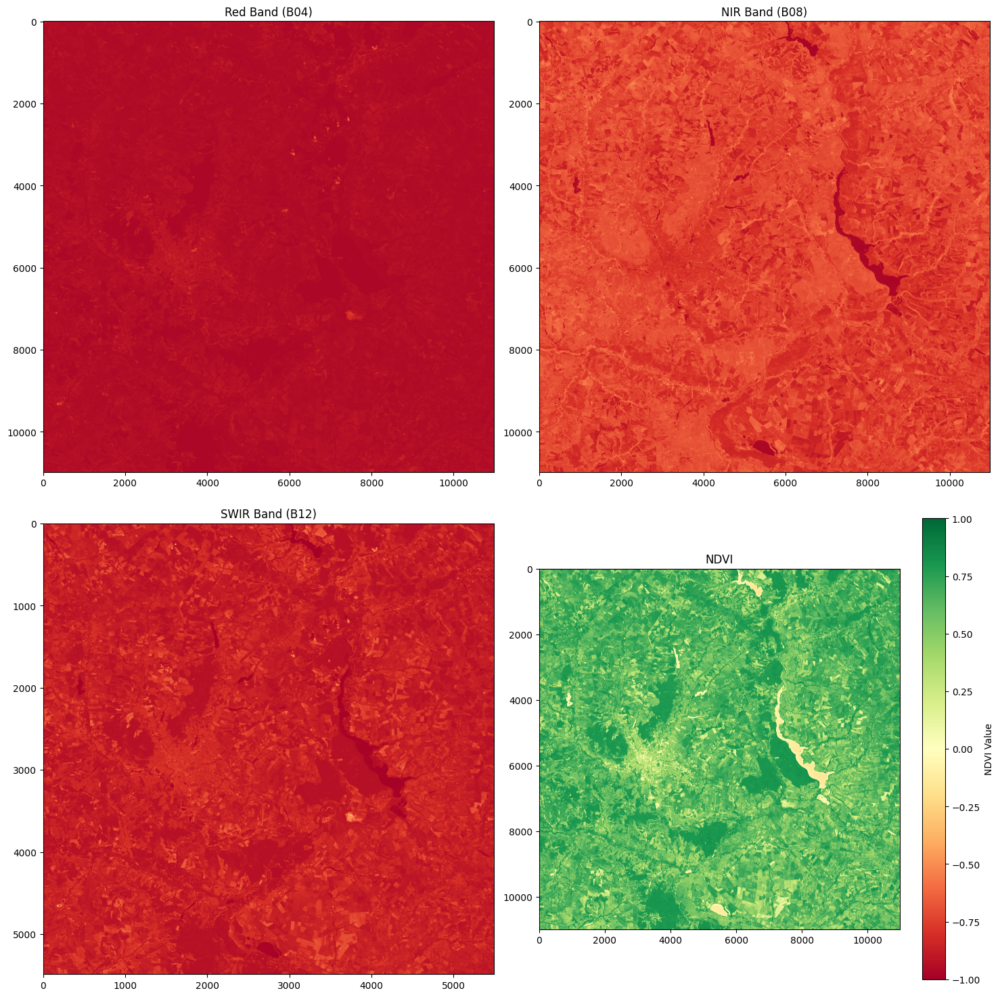

NDVI Statistics:
--------------------------------------------------
Mean NDVI: 0.616
Median NDVI: 0.656
Min NDVI: -1.000
Max NDVI: 1.000


In [68]:
# Let's load one image using key bands for vegetation analysis
# B04 (RED), B08 (NIR), B12 (SWIR)
sample_image = safe_dirs[0]
img_data_path = list((sample_image / "GRANULE").glob("*"))[0] / "IMG_DATA"

# Function to load and normalize band
def load_band(band_path):
    with rasterio.open(band_path) as src:
        band_data = src.read(1)
        # Normalize to 0-1 range
        band_data = band_data.astype(float)
        band_data = (band_data - band_data.min()) / (band_data.max() - band_data.min())
        return band_data

# Load the bands
red_band = load_band(list(img_data_path.glob(f"*_B04.jp2"))[0])
nir_band = load_band(list(img_data_path.glob(f"*_B08.jp2"))[0])
swir_band = load_band(list(img_data_path.glob(f"*_B12.jp2"))[0])

# Calculate NDVI (Normalized Difference Vegetation Index)
ndvi = (nir_band - red_band) / (nir_band + red_band)

# Visualize the bands and NDVI
fig, axes = plt.subplots(2, 2, figsize=(15, 15))
axes[0,0].imshow(red_band, cmap='RdYlBu')
axes[0,0].set_title('Red Band (B04)')
axes[0,1].imshow(nir_band, cmap='RdYlBu')
axes[0,1].set_title('NIR Band (B08)')
axes[1,0].imshow(swir_band, cmap='RdYlBu')
axes[1,0].set_title('SWIR Band (B12)')
im = axes[1,1].imshow(ndvi, cmap='RdYlGn')
axes[1,1].set_title('NDVI')

# Add colorbar for NDVI
plt.colorbar(im, ax=axes[1,1], label='NDVI Value')

plt.tight_layout()
plt.show()

# Print some statistics about NDVI
print("NDVI Statistics:")
print("-" * 50)
print(f"Mean NDVI: {ndvi.mean():.3f}")
print(f"Median NDVI: {np.median(ndvi):.3f}")
print(f"Min NDVI: {ndvi.min():.3f}")
print(f"Max NDVI: {ndvi.max():.3f}")

Comparing images from:
Early date: 20160212T084052
Late date: 20190909T083559


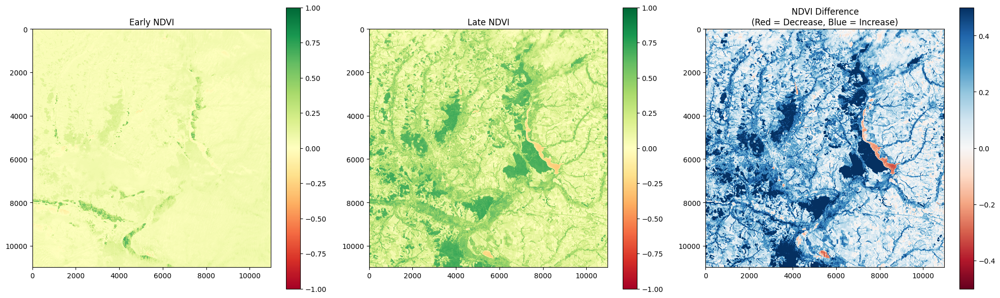

NDVI Change Statistics:
--------------------------------------------------
Mean change: 0.201
Standard deviation: 0.186
Max decrease: -1.214
Max increase: 1.014

Potential deforestation (NDVI decrease > 0.2):
Area affected: 0.43% of total area


In [69]:
# Let's select two images from different time periods
sorted_images = sorted(safe_dirs, key=lambda x: x.name)
early_image = sorted_images[0]  # First image
late_image = sorted_images[-1]  # Last image

# Print the dates we're comparing
print(f"Comparing images from:")
print(f"Early date: {early_image.name.split('_')[2]}")
print(f"Late date: {late_image.name.split('_')[2]}")

def calculate_ndvi(image_path):
    img_data_path = list((image_path / "GRANULE").glob("*"))[0] / "IMG_DATA"
    
    # Load RED and NIR bands
    red_band = load_band(list(img_data_path.glob(f"*_B04.jp2"))[0])
    nir_band = load_band(list(img_data_path.glob(f"*_B08.jp2"))[0])
    
    # Calculate NDVI
    ndvi = (nir_band - red_band) / (nir_band + red_band)
    return ndvi

# Calculate NDVI for both dates
ndvi_early = calculate_ndvi(early_image)
ndvi_late = calculate_ndvi(late_image)

# Calculate NDVI difference
ndvi_diff = ndvi_late - ndvi_early

# Visualize the changes
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Early NDVI
im1 = axes[0].imshow(ndvi_early, cmap='RdYlGn', vmin=-1, vmax=1)
axes[0].set_title('Early NDVI')
plt.colorbar(im1, ax=axes[0])

# Late NDVI
im2 = axes[1].imshow(ndvi_late, cmap='RdYlGn', vmin=-1, vmax=1)
axes[1].set_title('Late NDVI')
plt.colorbar(im2, ax=axes[1])

# NDVI Difference
im3 = axes[2].imshow(ndvi_diff, cmap='RdBu', vmin=-0.5, vmax=0.5)
axes[2].set_title('NDVI Difference\n(Red = Decrease, Blue = Increase)')
plt.colorbar(im3, ax=axes[2])

plt.tight_layout()
plt.show()

# Calculate statistics of changes
print("NDVI Change Statistics:")
print("-" * 50)
print(f"Mean change: {ndvi_diff.mean():.3f}")
print(f"Standard deviation: {ndvi_diff.std():.3f}")
print(f"Max decrease: {ndvi_diff.min():.3f}")
print(f"Max increase: {ndvi_diff.max():.3f}")

# Calculate potential deforestation areas
threshold = -0.2  # Significant NDVI decrease
deforested_pixels = np.sum(ndvi_diff < threshold)
total_pixels = ndvi_diff.size
deforested_percentage = (deforested_pixels / total_pixels) * 100

print(f"\nPotential deforestation (NDVI decrease > {abs(threshold)}):")
print(f"Area affected: {deforested_percentage:.2f}% of total area")

In [70]:
# Create a date-based index of available images
from datetime import datetime
image_dates = defaultdict(dict)

for safe_dir in safe_dirs:
    # Parse directory name components
    parts = safe_dir.name.split('_')
    date_str = parts[2]  # Get the date string
    tile = parts[5]      # Get the tile ID
    date = datetime.strptime(date_str, '%Y%m%dT%H%M%S').date()
    
    image_dates[tile][date] = safe_dir

# Create a list of all dates for analysis
all_dates = []
for tile_dates in image_dates.values():
    all_dates.extend(tile_dates.keys())
all_dates = sorted(list(set(all_dates)))

print("Total number of unique dates:", len(all_dates))
if all_dates:
    print("\nDate range of available images:")
    print("Start:", min(all_dates))
    print("End:", max(all_dates))
    
    # Print sample dates for each tile
    for tile in image_dates:
        dates = sorted(list(image_dates[tile].keys()))
        print(f"\nDates for tile {tile} (first 5):")
        for date in dates[:5]:
            print(date)
else:
    print("\nNo images found in the specified directory")

Total number of unique dates: 48

Date range of available images:
Start: 2016-02-12
End: 2019-09-09

Dates for tile T36UYA (first 5):
2016-02-12
2016-03-30
2016-04-05
2016-05-02
2016-05-09

Dates for tile T36UXA (first 5):
2018-07-26
2018-07-31
2018-08-05
2018-08-10
2018-08-15


In [71]:
# Create a function to standardize tile IDs
def standardize_tile_id(tile_id):
    # Remove 'T' prefix if it exists
    return tile_id.replace('T', '')

for safe_dir in safe_dirs:
    # Parse directory name components
    parts = safe_dir.name.split('_')
    date_str = parts[2]  # Get the date string
    tile = standardize_tile_id(parts[5])  # Get the tile ID and standardize it
    date = datetime.strptime(date_str, '%Y%m%dT%H%M%S').date()
    
    image_dates[tile][date] = safe_dir

# Create a function to find the closest images before and after an event
def find_closest_images(event_date, tile, image_dates, max_days=30):
    if tile not in image_dates:
        return None, None
        
    available_dates = sorted(list(image_dates[tile].keys()))
    before_dates = [d for d in available_dates if d < event_date]
    after_dates = [d for d in available_dates if d > event_date]
    
    before_image = max(before_dates) if before_dates else None
    after_image = min(after_dates) if after_dates else None
    
    # Check if the images are within max_days
    if before_image and (event_date - before_image).days > max_days:
        before_image = None
    if after_image and (after_image - event_date).days > max_days:
        after_image = None
        
    return before_image, after_image

deforestation_data = gpd.read_file('../Datasets/BoundingBox/deforestation.geojson')

# Add columns for before/after images
deforestation_data['event_date'] = deforestation_data['img_date'].dt.date
deforestation_data['before_image'] = None
deforestation_data['after_image'] = None
deforestation_data['time_diff_before'] = None
deforestation_data['time_diff_after'] = None

# Find matching images for each deforestation event
for idx, row in deforestation_data.iterrows():
    before_date, after_date = find_closest_images(
        row['event_date'], 
        row['tile'],  # No need to standardize as GeoJSON already uses format without 'T'
        image_dates
    )
    
    deforestation_data.at[idx, 'before_image'] = before_date
    deforestation_data.at[idx, 'after_image'] = after_date
    
    if before_date:
        deforestation_data.at[idx, 'time_diff_before'] = (row['event_date'] - before_date).days
    if after_date:
        deforestation_data.at[idx, 'time_diff_after'] = (after_date - row['event_date']).days

# Print statistics about the matches
print("Matching Statistics:")
print("-" * 50)
print(f"Total deforestation events: {len(deforestation_data)}")
print(f"Events with before images: {deforestation_data['before_image'].notna().sum()}")
print(f"Events with after images: {deforestation_data['after_image'].notna().sum()}")
print(f"Events with both images: {(deforestation_data['before_image'].notna() & deforestation_data['after_image'].notna()).sum()}")

# Print time difference statistics
print("\nTime Difference Statistics (days):")
print("-" * 50)
print("Before images:")
print(deforestation_data['time_diff_before'].describe())
print("\nAfter images:")
print(deforestation_data['time_diff_after'].describe())

# Print some example matches
print("\nExample Matches (first 5):")
print("-" * 50)
print(deforestation_data[['tile', 'event_date', 'before_image', 'after_image', 'time_diff_before', 'time_diff_after']].head())

Matching Statistics:
--------------------------------------------------
Total deforestation events: 5696
Events with before images: 1200
Events with after images: 1299
Events with both images: 1045

Time Difference Statistics (days):
--------------------------------------------------
Before images:
count     1200
unique       8
top          5
freq       925
Name: time_diff_before, dtype: int64

After images:
count     1299
unique      12
top          5
freq       999
Name: time_diff_after, dtype: int64

Example Matches (first 5):
--------------------------------------------------
    tile  event_date before_image after_image time_diff_before time_diff_after
0  36UXA  2016-04-09         None        None             None            None
1  36UXA  2016-04-09         None        None             None            None
2  36UXA  2016-04-09         None        None             None            None
3  36UXA  2016-04-09         None        None             None            None
4  36UXA  2016-04-

In [72]:
# Add analysis of matches by tile and year
deforestation_data['year'] = deforestation_data['event_date'].apply(lambda x: x.year)

# Print statistics by tile and year
print("Coverage by Tile and Year:")
print("-" * 50)
for tile in deforestation_data['tile'].unique():
    tile_data = deforestation_data[deforestation_data['tile'] == tile]
    print(f"\nTile: {tile}")
    for year in sorted(tile_data['year'].unique()):
        year_data = tile_data[tile_data['year'] == year]
        matched = year_data[year_data['before_image'].notna() & year_data['after_image'].notna()]
        print(f"Year {year}:")
        print(f"  Total events: {len(year_data)}")
        print(f"  Matched events: {len(matched)} ({len(matched)/len(year_data)*100:.1f}%)")

# Show some examples of successful matches
print("\nExample Successful Matches:")
print("-" * 50)
successful_matches = deforestation_data[
    deforestation_data['before_image'].notna() & 
    deforestation_data['after_image'].notna()
].head(5)

print("\nFirst 5 successful matches:")
print(successful_matches[['tile', 'event_date', 'before_image', 'after_image', 'time_diff_before', 'time_diff_after']])

# Distribution of time differences
print("\nTime Difference Distribution (Before Images):")
print(deforestation_data['time_diff_before'].value_counts().sort_index())

print("\nTime Difference Distribution (After Images):")
print(deforestation_data['time_diff_after'].value_counts().sort_index())

Coverage by Tile and Year:
--------------------------------------------------

Tile: 36UXA
Year 2016:
  Total events: 10
  Matched events: 0 (0.0%)
Year 2017:
  Total events: 173
  Matched events: 0 (0.0%)
Year 2018:
  Total events: 1324
  Matched events: 594 (44.9%)
Year 2019:
  Total events: 353
  Matched events: 0 (0.0%)

Tile: 36UYA
Year 2016:
  Total events: 3308
  Matched events: 4 (0.1%)
Year 2019:
  Total events: 528
  Matched events: 447 (84.7%)

Example Successful Matches:
--------------------------------------------------

First 5 successful matches:
      tile  event_date before_image after_image time_diff_before  \
842  36UXA  2018-07-31   2018-07-26  2018-08-05                5   
843  36UXA  2018-07-31   2018-07-26  2018-08-05                5   
844  36UXA  2018-07-31   2018-07-26  2018-08-05                5   
845  36UXA  2018-07-31   2018-07-26  2018-08-05                5   
846  36UXA  2018-07-31   2018-07-26  2018-08-05                5   

    time_diff_after  
8

In [73]:
# Sample size calculation with confidence level
def calculate_strata_sizes(total_events=480, confidence_level=0.95, margin_error=0.1):
    z_score = stats.norm.ppf((1 + confidence_level) / 2)
    
    # Define strata bounds and proportions
    strata_bounds = [0, 3.37, 10.10, np.inf]  # hectares
    strata_props = [0.8, 0.15, 0.05]  # given proportions
    
    # Calculate sample sizes for each stratum
    sample_sizes = []
    for prop in strata_props:
        stratum_n = int(np.ceil((z_score**2 * prop * (1-prop)) / margin_error**2))
        sample_sizes.append(min(stratum_n, int(total_events * prop)))
    
    return sample_sizes

In [74]:
def group_deforestation_events(gdf, spatial_thresh, temporal_thresh):
    # Create time-based groups
    gdf['temporal_group'] = pd.to_datetime(gdf['date']).dt.to_period('D')
    temporal_groups = gdf.groupby(pd.Grouper(key='temporal_group', freq=f'{temporal_thresh}D'))
    
    grouped_events = []
    for _, time_group in temporal_groups:
        if len(time_group) > 0:
            # Buffer and merge nearby polygons
            buffered = time_group.geometry.buffer(spatial_thresh)
            merged = unary_union(buffered)
            grouped_events.append(merged)
            
    return gpd.GeoDataFrame(geometry=grouped_events)

In [75]:
import datetime
# Define temporal window
temporal_window = [
    datetime.datetime(2018, 7, 15),
    datetime.datetime(2018, 9, 15)
]

In [76]:
def analyze_size_distribution(gdf):
    """Analyze the size distribution of events before sampling"""
    size_stats = {
        'small': len(gdf[gdf['area_ha'] <= 3.37]),
        'medium': len(gdf[(gdf['area_ha'] > 3.37) & (gdf['area_ha'] <= 10.10)]),
        'large': len(gdf[gdf['area_ha'] > 10.10])
    }
    return size_stats

def sample_deforestation_events(geojson_path, output_dir, temporal_window):
    # Read and initial processing
    gdf = gpd.read_file(geojson_path)
    
    # Log initial dataset size
    logging.info(f"Total events in dataset: {len(gdf)}")
    
    # Convert dates and filter for our temporal window
    gdf['img_date'] = pd.to_datetime(gdf['img_date'])
    mask = (gdf['img_date'] >= temporal_window[0]) & (gdf['img_date'] <= temporal_window[1])
    filtered_gdf = gdf[mask].copy()
    
    logging.info(f"Events in temporal window: {len(filtered_gdf)}")
    
    # Project to UTM and calculate area in hectares
    filtered_gdf = filtered_gdf.to_crs('EPSG:32736')  # UTM zone 36N for Ukraine
    filtered_gdf['area_ha'] = filtered_gdf.geometry.area / 10000
    
    # Analyze size distribution before sampling
    initial_distribution = analyze_size_distribution(filtered_gdf)
    logging.info("Initial size distribution:")
    logging.info(initial_distribution)
    
    # Define strata with adjusted sample sizes based on availability
    filtered_gdf['size_category'] = pd.cut(
        filtered_gdf['area_ha'],
        bins=[0, 3.37, 10.10, float('inf')],
        labels=['small', 'medium', 'large']
    )
    
    # Adjust sample sizes based on availability
    target_sizes = {'small': 50, 'medium': 15, 'large': 7}
    actual_sizes = {}
    
    for category, target in target_sizes.items():
        available = len(filtered_gdf[filtered_gdf['size_category'] == category])
        actual_sizes[category] = min(target, available)
        logging.info(f"{category}: Target={target}, Available={available}, Will sample={actual_sizes[category]}")
    
    # Stratified sampling with adjusted sizes
    sampled_events = pd.DataFrame()
    
    for category, size in actual_sizes.items():
        stratum = filtered_gdf[filtered_gdf['size_category'] == category]
        if len(stratum) > 0:
            sampled = stratum.sample(
                n=size, 
                random_state=42
            )
            sampled_events = pd.concat([sampled_events, sampled])
    
    # Convert back to GeoDataFrame and process
    sampled_events = gpd.GeoDataFrame(sampled_events, geometry='geometry')
    sampled_events = sampled_events.to_crs(4326)
    
    # Save results
    output_dir = Path(output_dir).resolve()
    output_dir.mkdir(parents=True, exist_ok=True)
    
    timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    output_path = output_dir / f"sampled_events_{timestamp}.geojson"
    
    sampled_events.to_file(output_path, driver='GeoJSON')
    
    return sampled_events, output_path, initial_distribution

# Execute sampling
sampled_events, saved_path, initial_dist = sample_deforestation_events(
    geojson_path=geojson_path,
    output_dir=Path("../Datasets/Testing/Samples").resolve(),
    temporal_window=temporal_window
)

# Display comprehensive results
print("\nInitial Distribution in Temporal Window:")
for category, count in initial_dist.items():
    print(f"{category}: {count}")

print("\nFinal Sample Distribution:")
print(sampled_events['size_category'].value_counts())

print(f"\nSpatial Distribution:")
print(sampled_events.groupby('tile')['size_category'].count())

print(f"\nTemporal Distribution:")
print(sampled_events.groupby(sampled_events['img_date'].dt.strftime('%Y-%m-%d'))['size_category'].count())


Initial Distribution in Temporal Window:
small: 656
medium: 0
large: 0

Final Sample Distribution:
size_category
small     50
medium     0
large      0
Name: count, dtype: int64

Spatial Distribution:
tile
36UXA    50
Name: size_category, dtype: int64

Temporal Distribution:
img_date
2018-07-21     1
2018-07-26     3
2018-07-31     8
2018-08-05     7
2018-08-10     7
2018-08-15     3
2018-08-20     4
2018-08-25     1
2018-08-30    11
2018-09-04     2
2018-09-14     3
Name: size_category, dtype: int64


In [77]:
# First, let's analyze the raw data to understand the area distribution
def analyze_raw_distribution(geojson_path):
    gdf = gpd.read_file(geojson_path)
    gdf = gdf.to_crs('EPSG:32736')  # UTM zone 36N for Ukraine
    gdf['area_ha'] = gdf.geometry.area / 10000
    
    print("Area Statistics (hectares):")
    print(gdf['area_ha'].describe())
    
    print("\nQuantile Distribution:")
    quantiles = [0.1, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99]
    print(gdf['area_ha'].quantile(quantiles))
    
    # Count events by tile
    print("\nEvents per tile:")
    print(gdf['tile'].value_counts())
    
    # Temporal distribution by month
    gdf['month'] = pd.to_datetime(gdf['img_date']).dt.strftime('%Y-%m')
    print("\nEvents per month:")
    print(gdf['month'].value_counts().sort_index())
    
    return gdf

# Analyze full dataset
raw_data = analyze_raw_distribution(geojson_path)

# Let's adjust our size categories based on the actual distribution
def recalculate_size_thresholds(gdf, num_categories=3):
    quantiles = np.linspace(0, 1, num_categories + 1)[1:-1]
    thresholds = gdf['area_ha'].quantile(quantiles)
    
    print("\nProposed new size thresholds:")
    print(f"Small: <= {thresholds.iloc[0]:.2f} ha")
    print(f"Medium: {thresholds.iloc[0]:.2f} - {thresholds.iloc[1]:.2f} ha")
    print(f"Large: > {thresholds.iloc[1]:.2f} ha")
    
    return thresholds.tolist()

# Calculate new thresholds
new_thresholds = recalculate_size_thresholds(raw_data)

Area Statistics (hectares):
count    5696.000000
mean        2.382818
std         3.918158
min         0.001489
25%         0.307715
50%         1.272924
75%         2.941244
max        67.301044
Name: area_ha, dtype: float64

Quantile Distribution:
0.10     0.083259
0.25     0.307715
0.50     1.272924
0.75     2.941244
0.90     5.353595
0.95     7.574441
0.99    17.450756
Name: area_ha, dtype: float64

Events per tile:
tile
36UYA    3836
36UXA    1860
Name: count, dtype: int64

Events per month:
month
2016-01    3122
2016-02       6
2016-04      10
2016-05       2
2016-06      34
2016-07      40
2016-08      56
2016-10      28
2016-11       2
2016-12      18
2017-02       2
2017-08      13
2017-09      55
2017-10      17
2017-11      86
2018-01      47
2018-02     113
2018-03      45
2018-04      86
2018-05      50
2018-06     217
2018-07     169
2018-08     480
2018-09     117
2019-02       2
2019-03     227
2019-04     240
2019-05      34
2019-06     127
2019-07      59
2019-08     

In [78]:
def sample_deforestation_events(geojson_path, output_dir, temporal_window):

    # Read and process data
    gdf = gpd.read_file(geojson_path)
    gdf['img_date'] = pd.to_datetime(gdf['img_date'])

    # Filter temporal window
    mask = (gdf['img_date'] >= temporal_window[0]) & (gdf['img_date'] <= temporal_window[1])
    filtered_gdf = gdf[mask].copy()

    # Calculate areas
    filtered_gdf = filtered_gdf.to_crs('EPSG:32736')
    filtered_gdf['area_ha'] = filtered_gdf.geometry.area / 10000

    # Define size categories
    filtered_gdf['size_category'] = pd.cut(
        filtered_gdf['area_ha'],
        bins=[0, 0.60, 2.35, float('inf')],
        labels=['small', 'medium', 'large']
    )

    # Calculate available events per category
    available = filtered_gdf['size_category'].value_counts()
    print("Available events per category:")
    print(available)

    # Define target samples (adjusted based on availability)
    target_samples = {
        'small': min(50, available.get('small', 0)),
        'medium': min(15, available.get('medium', 0)),
        'large': min(7, available.get('large', 0))
    }
    print("\nTarget samples per category:")
    print(target_samples)

    # Sample from each category
    sampled_events = pd.DataFrame()
    for category, target in target_samples.items():
        if target > 0:
            stratum = filtered_gdf[filtered_gdf['size_category'] == category]
            # Ensure even temporal distribution within each category
            sampled = stratum.groupby(stratum['img_date'].dt.to_period('M')).apply(
                lambda x: x.sample(
                    n=min(
                        max(1, target // len(stratum['img_date'].dt.to_period('M').unique())),
                        len(x)
                    ),
                    random_state=42
                )
            ).reset_index(drop=True)
            # If we still need more samples, take them randomly from the remaining events
            if len(sampled) < target:
                remaining = stratum[~stratum.index.isin(sampled.index)]
                if len(remaining) > 0:
                    additional = remaining.sample(
                        n=min(target - len(sampled), len(remaining)),
                        random_state=42
                    )
                    sampled = pd.concat([sampled, additional])
            sampled_events = pd.concat([sampled_events, sampled])

    # Convert to GeoDataFrame and prepare for saving
    sampled_events = gpd.GeoDataFrame(sampled_events, geometry='geometry')
    sampled_events = sampled_events.to_crs(4326)

    # Assign 'name' property
    sampled_events['name'] = ['PLOT-{0:05d}'.format(i) for i in range(1, len(sampled_events) + 1)]
    # Filter out PLOT-00010 before saving
    sampled_events = sampled_events[sampled_events['name'] != 'PLOT-00010']


    # Convert 'img_date' back to string format 'YYYY-MM-DD' before saving
    sampled_events['img_date'] = sampled_events['img_date'].dt.strftime('%Y-%m-%d')

    # Save results
    output_dir = Path(output_dir).resolve()
    output_dir.mkdir(parents=True, exist_ok=True)
    timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    output_path = output_dir / f"sampled_events_{timestamp}.geojson"
    sampled_events.to_file(output_path, driver='GeoJSON')

    # Print detailed statistics
    print(f"\nTotal number of sampled events: {len(sampled_events)}")
    print("\nFinal sample distribution:")
    print("\nBy size category:")
    print(sampled_events['size_category'].value_counts())
    print("\nTemporal distribution:")
    print(sampled_events.groupby([
        sampled_events['img_date'].str.slice(0, 7),  # Get 'YYYY-MM' from 'YYYY-MM-DD'
        'size_category'
    ], observed=True).size().unstack(fill_value=0))

    return sampled_events, output_path

# Execute sampling with new parameters
sampled_events, saved_path = sample_deforestation_events(
    geojson_path=geojson_path,
    output_dir=Path("../Datasets/Testing/Samples").resolve(),
    temporal_window=temporal_window
)

# Additional analysis of the results
print("\nArea statistics of sampled events:")
print(sampled_events['area_ha'].describe())

print("\nDate distribution:")
print(sampled_events['img_date'].value_counts().sort_index())

Available events per category:
size_category
small     608
medium     47
large       1
Name: count, dtype: int64

Target samples per category:
{'small': 50, 'medium': 15, 'large': 1}

Total number of sampled events: 65

Final sample distribution:

By size category:
size_category
small     49
medium    15
large      1
Name: count, dtype: int64

Temporal distribution:
size_category  small  medium  large
img_date                           
2018-07           17       5      0
2018-08           16       8      1
2018-09           16       2      0

Area statistics of sampled events:
count    65.000000
mean      0.446618
std       0.523834
min       0.021443
25%       0.100076
50%       0.241322
75%       0.547425
max       2.353282
Name: area_ha, dtype: float64

Date distribution:
img_date
2018-07-21     7
2018-07-26     5
2018-07-31    10
2018-08-05     3
2018-08-10     3
2018-08-15     1
2018-08-20     1
2018-08-25     1
2018-08-30    16
2018-09-04     5
2018-09-14    13
Name: count, dtyp

In [79]:
def visualize_sample_distribution(sampled_events):
    # Create a figure with two subplots side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # Size category distribution
    sns.countplot(data=sampled_events, x='size_category', ax=ax1)
    ax1.set_title('Distribution by Size Category')
    ax1.set_ylabel('Count')
    
    # Temporal distribution
    sampled_events['date'] = pd.to_datetime(sampled_events['img_date']).dt.date
    sns.histplot(data=sampled_events, x='date', ax=ax2)
    ax2.set_title('Temporal Distribution')
    ax2.tick_params(axis='x', rotation=45)
    
    # Save metadata
    sample_metadata = {
        'total_samples': len(sampled_events),
        'temporal_range': {
            'start': str(sampled_events['img_date'].min()),
            'end': str(sampled_events['img_date'].max())
        },
        'size_distribution': sampled_events['size_category'].value_counts().to_dict(),
        'area_statistics': {
            'mean': float(sampled_events['area_ha'].mean()),
            'median': float(sampled_events['area_ha'].median()),
            'std': float(sampled_events['area_ha'].std())
        }
    }
    
    output_dir = Path("../Docs/Diagrams/")
    with open(output_dir / 'sample_metadata.json', 'w') as f:
        json.dump(sample_metadata, f, indent=2)
    
    plt.tight_layout()
    plt.savefig(output_dir / 'sample_distribution.png')
    plt.close()

# Generate visualizations
visualize_sample_distribution(sampled_events)

In [80]:
def visualize_patch(patch_path):
    """Visualize a saved patch with all its bands and indices"""
    # Load the patch
    patch = np.load(patch_path)
    # Extract date and sequence number from the filename
    def get_capture_date(filepath):
        # Assuming the date is included in the directory name or filepath
        match = re.search(r'_(\d{8})T', str(filepath))
        if match:
            date_str = match.group(1)
            return f"{date_str[:4]}-{date_str[4:6]}-{date_str[6:8]}"
        else:
            return "Unknown Date"
    def get_patch_sequence(filepath):
        # Extract the patch sequence number (_P1, _P2, etc.)
        match = re.search(r'_P(\d+)\.npy$', filepath.name)
        if match:
            return int(match.group(1))
        else:
            # If no sequence number, assume it's the first patch
            return 1
    # Get the patch sequence number
    patch_seq = get_patch_sequence(patch_path)
    capture_date = get_capture_date(patch_path)
    # Define band names for labeling
    band_names = ['B02', 'B03', 'B04', 'B08', 'B8A', 'B11', 'B12', 'NDVI', 'NDMI']
    # Build the plot title
    title = f'Plot: {patch_path.name}\nDate: {capture_date}'
    if patch_seq > 1:
        title += f'\nPatch Sequence: {patch_seq}'
    # Create a figure with subplots for each band/index
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))
    fig.suptitle(title, fontsize=16)
    
    # Plot each band/index
    for idx, (ax, name) in enumerate(zip(axes.flat, band_names)):
        im = ax.imshow(patch[idx], cmap='viridis')
        ax.set_title(name)
        plt.colorbar(im, ax=ax)
    
    plt.tight_layout()
    return fig

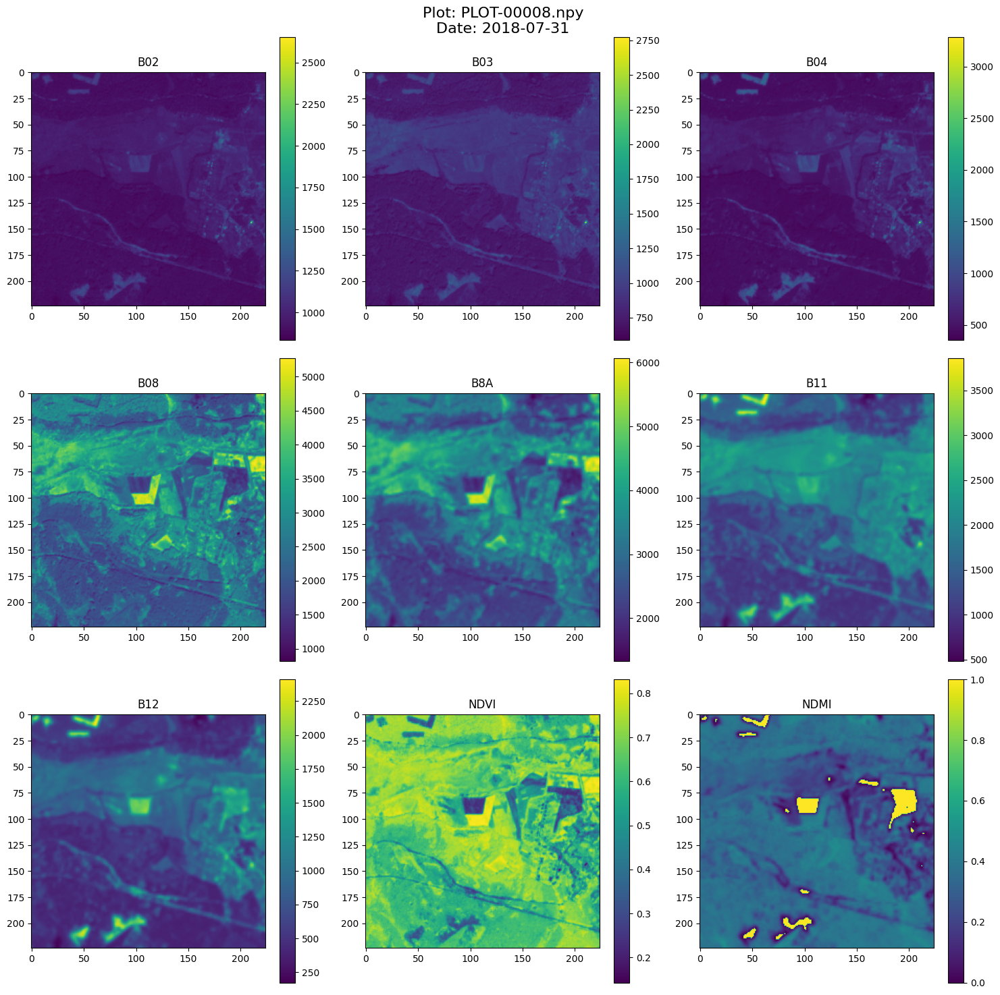

In [81]:
tiles_dir = Path("../Datasets/Testing/Tiles")
patch_files = list(tiles_dir.glob("**/*.npy"))

# Select a random patch from the list
patch_show = random.choice(patch_files)
fig = visualize_patch(patch_show)
plt.show()

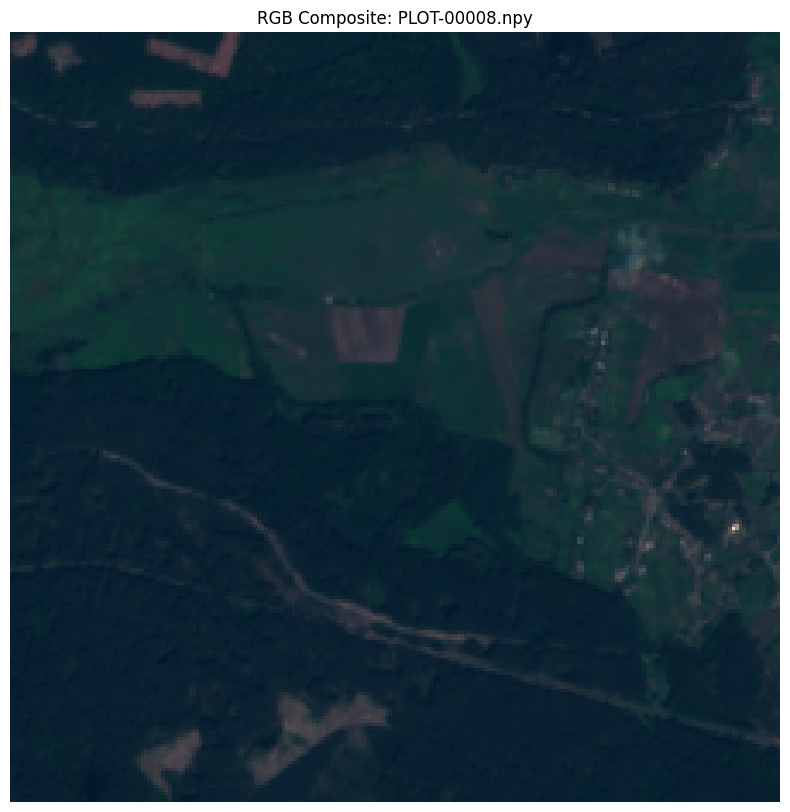

In [82]:
def show_rgb_composite(patch_path):
    """Show true color RGB composite"""
    patch = np.load(patch_path)
    
    # Use B04 (Red), B03 (Green), B02 (Blue) for true color
    rgb = np.stack([patch[2], patch[1], patch[0]], axis=-1)
    
    # Normalize for display
    rgb = (rgb - rgb.min()) / (rgb.max() - rgb.min())
    
    plt.figure(figsize=(10, 10))
    plt.imshow(rgb)
    plt.title(f'RGB Composite: {patch_path.name}')
    plt.axis('off')
    plt.show()

# Example usage:
show_rgb_composite(patch_show)

In [83]:
def visualize_temporal_patches(tiles_dir, plot_identifier):
    """Visualize the same patch location across different dates using the plot number."""
    # Determine if input is a number or a string starting with 'PLOT-'
    if isinstance(plot_identifier, int) or plot_identifier.isdigit():
        plot_name = f"PLOT-{int(plot_identifier):05d}"
    elif str(plot_identifier).startswith('PLOT-'):
        plot_name = plot_identifier
    else:
        print(f"Invalid plot identifier: {plot_identifier}")
        return

    # Find all patch files matching the plot name (including multiple patches)
    patch_files = list(tiles_dir.glob(f"**/{plot_name}*.npy"))
    
    # Check if any patches are found
    if not patch_files:
        print(f"No patches found for plot {plot_name}")
        return
    
    # Extract date and sequence number from the filename
    def get_capture_date(filepath):
        # Assuming the date is included in the directory name or filepath
        match = re.search(r'_(\d{8})T', str(filepath))
        if match:
            date_str = match.group(1)
            return f"{date_str[:4]}-{date_str[4:6]}-{date_str[6:8]}"
        else:
            return "Unknown Date"
        
    def get_patch_sequence(filepath):
        # Extract the patch sequence number (_P1, _P2, etc.)
        match = re.search(r'_P(\d+)\.npy$', filepath.name)
        if match:
            return int(match.group(1))
        else:
            # If no sequence number, assume it's the first patch
            return 1

    # Sort the files based on capture date and patch sequence
    patch_files.sort(key=lambda x: (get_capture_date(x), get_patch_sequence(x)))
    
    n_patches = len(patch_files)
    fig, axes = plt.subplots(n_patches, 1, figsize=(15, 5*n_patches))
    
    # Ensure axes is iterable
    if n_patches == 1:
        axes = [axes]
    
    for idx, patch_file in enumerate(patch_files):
        patch = np.load(patch_file)
        rgb = np.stack([patch[2], patch[1], patch[0]], axis=-1)
        
        # Robust normalization
        rgb_min = rgb.min()
        rgb_max = rgb.max()
        if rgb_max > rgb_min:
            rgb = (rgb - rgb_min) / (rgb_max - rgb_min)
        else:
            rgb = np.zeros_like(rgb)
        
        # Get and display the actual capture date
        file_name = patch_file.name
        capture_date = get_capture_date(patch_file)
        patch_seq = get_patch_sequence(patch_file)
        
        # Build the plot title
        title = f'Plot: {plot_name}\nFile: {file_name}\nDate: {capture_date}'
        if patch_seq > 1:
            title += f'\nPatch Sequence: {patch_seq}'
        
        # Set the title and plot the image
        axes[idx].imshow(rgb)
        axes[idx].set_title(title)
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()
    return patch_file

In [84]:
# Define plot patterns to process
plot_patterns = ['00002', '00006', '00007', '00008', '00009', '00011']  # Add more patterns like: ['00010', '00001', '00002'] or ['00*']

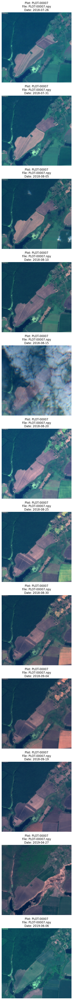

In [85]:
# Display temporal sequence
num = 7
tiles_dir = Path("../Datasets/Testing/Tiles")
patch_file = visualize_temporal_patches(tiles_dir, num)

In [86]:
# Set base paths
base_path = Path('../Datasets/Testing/Tiles')
processed_path = Path('../Datasets/Testing/Processed')

# Ensure processed directory exists
processed_path.mkdir(exist_ok=True)

# Process files for each pattern
for pattern in plot_patterns:
    search_pattern = f"PLOT-{pattern}.npy"
    npy_files = glob.glob(str(base_path / f"**/{search_pattern}"), recursive=True)
    
    # Process each file
    for file_path in npy_files:
        # Convert to Path object
        path = Path(file_path)
        
        # Get parent folder name and extract date-time
        parent_folder = path.parent.name
        date_time = parent_folder.split('_')[2]  # Gets 20180731T083601
        
        # Create new filename and path
        new_name = f"{date_time}_{path.name}"
        new_path = processed_path / new_name
        
        # Copy file to new location with new name
        shutil.copy2(path, new_path)

In [87]:
# Load a sample patch
patch_show = Path(f"{patch_file}")
print(patch_file)
patch_data = np.load(patch_file)

# Verify shape and channels
print(f"Patch shape: {patch_data.shape}")  # Should be (9, 224, 224)
print(f"Channel stats:")
for i, channel_name in enumerate(['B02', 'B03', 'B04', 'B08', 'B8A', 'B11', 'B12', 'NDVI', 'NDMI']):
    print(f"{channel_name}: min={patch_data[i].min():.3f}, max={patch_data[i].max():.3f}")

../Datasets/Testing/Tiles/S2A_MSIL1C_20190606T083601_N0207_R064_T36UXA_20190606T104250/PLOT-00007.npy
Patch shape: (9, 224, 224)
Channel stats:
B02: min=757.000, max=1411.000
B03: min=558.000, max=1739.000
B04: min=312.000, max=1428.000
B08: min=426.000, max=5801.000
B8A: min=388.000, max=5738.000
B11: min=190.000, max=2928.000
B12: min=98.000, max=2452.000
NDVI: min=0.037, max=0.861
NDMI: min=0.001, max=1.000


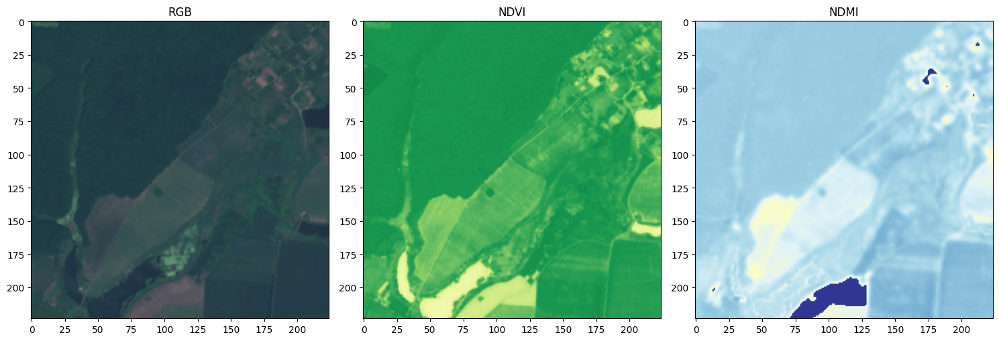

In [88]:
def visualize_patch(patch_data):
    # True color composite (B04, B03, B02)
    rgb = np.stack([patch_data[2], patch_data[1], patch_data[0]], axis=-1)
    
    # Normalize for visualization
    rgb = np.clip(rgb / 3000, 0, 1)
    
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # RGB
    axes[0].imshow(rgb)
    axes[0].set_title("RGB")
    
    # NDVI
    axes[1].imshow(patch_data[7], cmap='RdYlGn', vmin=-1, vmax=1)
    axes[1].set_title("NDVI")
    
    # NDMI
    axes[2].imshow(patch_data[8], cmap='RdYlBu', vmin=-1, vmax=1)
    axes[2].set_title("NDMI")
    
    plt.tight_layout()
    plt.show()

visualize_patch(patch_data)

In [89]:
# Define the path to the example SAFE directory
example_path = "../Datasets/Sentinel-2/S2A_MSIL1C_20190815T083601_N0208_R064_T36UYA_20190815T123742/S2A_MSIL1C_20190815T083601_N0208_R064_T36UYA_20190815T123742.SAFE"

# Find the index of the folder in the safe_dirs list
folder_index = safe_dirs.index(Path(example_path))

# Print the index
print(f"The index of the folder is: {folder_index}")

The index of the folder is: 12


Geometry bounds: (669658.2052839187, 5558476.831810809, 669756.124239329, 5558574.97995005)
Patch bounds: (669658.2052839187, 5558476.831810809, 669756.124239329, 5558574.97995005)
Does geometry intersect patch bounds: True
Is geometry entirely within patch bounds: True
Patch shape: (9, 224, 224)


/Users/muhammedazhar/.miniconda3/envs/COMP1252-MP/lib/python3.10/site-packages/rasterio/plot.py:156: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.imshow(arr, **kwargs)


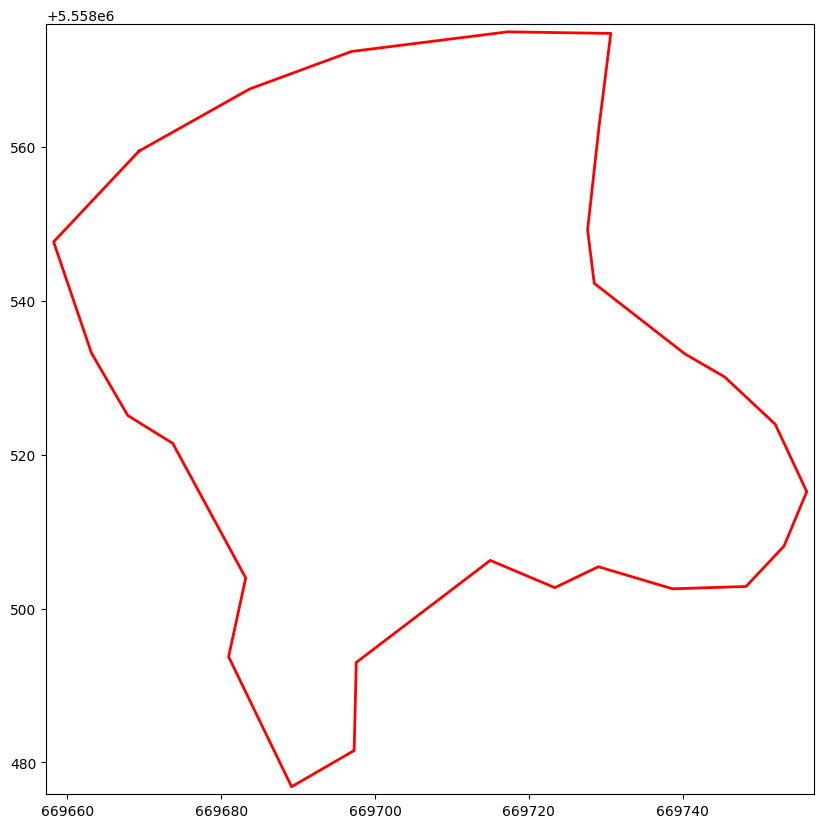

In [90]:
def verify_patch_coordinates(sentinel_path, geojson_path, patch_path):
    try:
        # Load the GeoJSON geometry
        gdf = gpd.read_file(geojson_path)
        
        # Find B02 band path safely
        b02_paths = list(Path(sentinel_path).glob('GRANULE/*/IMG_DATA/*B02.jp2'))
        if not b02_paths:
            raise FileNotFoundError("B02 band not found")
        b02_path = b02_paths[0]
        
        with rasterio.open(b02_path) as src:
            # Verify and transform CRS
            if not gdf.crs:
                raise ValueError("GeoJSON CRS is missing")
            if not src.crs:
                raise ValueError("Raster CRS is missing")
            
            if gdf.crs != src.crs:
                gdf = gdf.to_crs(src.crs)
            
            # Extract patch index and get geometry
            patch_idx = int(Path(patch_path).stem.split('-')[1])
            if patch_idx >= len(gdf):
                raise IndexError(f"Patch index {patch_idx} exceeds GeoJSON features")

            geometry = gdf.iloc[patch_idx].geometry
            geom_bounds = geometry.bounds
            window = from_bounds(*geom_bounds, transform=src.transform)

            # Get the spatial bounds of the window (patch)
            patch_bounds = window_bounds(window, transform=src.transform)
            
            # Create a shapely Polygon from patch_bounds
            patch_polygon = box(*patch_bounds)
            
            # Check if geometry is within the patch polygon
            intersects = geometry.intersects(patch_polygon)
            is_within = geometry.within(patch_polygon)
            
            print(f"Geometry bounds: {geom_bounds}")
            print(f"Patch bounds: {patch_bounds}")
            print(f"Does geometry intersect patch bounds: {intersects}")
            print(f"Is geometry entirely within patch bounds: {is_within}")
            
            # Load and validate patch
            patch = np.load(patch_path)

            # Expected dimensions from window
            expected_height = int(window.height)
            expected_width = int(window.width)

            print(f"Patch shape: {patch.shape}")
            
            # Visualize the patch with geometry
            visualize_patch_with_geometry(sentinel_path, geometry, window)
            
            return {
                'geometry_bounds': geom_bounds,
                'patch_bounds': patch_bounds,
                'intersects': intersects,
                'is_within': is_within
            }
    except Exception as e:
        print(f"Error: {str(e)}")
        return None

def visualize_patch_with_geometry(sentinel_path, geometry, window):
    b02_paths = list(Path(sentinel_path).glob('GRANULE/*/IMG_DATA/*B02.jp2'))
    if not b02_paths:
        raise FileNotFoundError("B02 band not found")
    b02_path = b02_paths[0]
    
    with rasterio.open(b02_path) as src:
        patch_data = src.read(1, window=window)
        patch_transform = src.window_transform(window)
        
    fig, ax = plt.subplots(figsize=(10, 10))
    
    # Get bounds of the geometry
    minx, miny, maxx, maxy = geometry.bounds
    
    # Add a small buffer (1% of the range)
    buffer_x = (maxx - minx) * 0.01
    buffer_y = (maxy - miny) * 0.01
    
    # Show the raster data
    rasterio.plot.show(patch_data, transform=patch_transform, ax=ax, cmap='gray')
    
    # Set limits with buffer
    ax.set_xlim([minx - buffer_x, maxx + buffer_x])
    ax.set_ylim([miny - buffer_y, maxy + buffer_y])
    
    # Plot the geometry
    if geometry.geom_type == 'Polygon':
        x, y = geometry.exterior.xy
        ax.plot(x, y, color='red', linewidth=2)
    elif geometry.geom_type == 'MultiPolygon':
        for polygon in geometry.geoms:
            x, y = polygon.exterior.xy
            ax.plot(x, y, color='red', linewidth=2)
    else:
        print(f"Unsupported geometry type: {geometry.geom_type}")
    
    plt.show()

# Example usage
result = verify_patch_coordinates(
    sentinel_path=safe_dirs[folder_index],
    geojson_path=saved_path,
    patch_path=patch_files[7]
)

In [91]:
def verify_all_patches(sentinel_path, geojson_path, patches_dir):
    try:
        # Load the GeoJSON geometries
        gdf = gpd.read_file(geojson_path)
        
        # Locate the B02 band image
        b02_paths = list(Path(sentinel_path).glob('GRANULE/*/IMG_DATA/*B02.jp2'))
        if not b02_paths:
            raise FileNotFoundError("B02 band not found in the specified Sentinel-2 data directory.")
        b02_path = b02_paths[0]
        
        with rasterio.open(b02_path) as src:
            # Ensure CRS alignment between geometries and raster
            if not gdf.crs:
                raise ValueError("CRS is missing in the GeoJSON file.")
            if not src.crs:
                raise ValueError("CRS is missing in the raster data.")
            
            if gdf.crs != src.crs:
                gdf = gdf.to_crs(src.crs)
            
            total_patches = 0
            intersects_count = 0
            within_count = 0
            
            # List all patch files in the directory
            patch_paths = sorted(Path(patches_dir).glob('*.npy'))
            
            for patch_path in patch_paths:
                total_patches += 1
                
                # Extract the patch index from the file name
                patch_idx = int(Path(patch_path).stem.split('-')[1]) - 1
                if patch_idx >= len(gdf):
                    print(f"Warning: Patch index {patch_idx} exceeds the number of geometries in the GeoJSON file.")
                    continue

                geometry = gdf.iloc[patch_idx].geometry
                geom_bounds = geometry.bounds
                window = from_bounds(*geom_bounds, transform=src.transform)

                # Calculate the spatial bounds of the patch
                patch_bounds = window_bounds(window, transform=src.transform)
                patch_polygon = box(*patch_bounds)
                
                # Check spatial relationships
                intersects = geometry.intersects(patch_polygon)
                is_within = geometry.within(patch_polygon)
                
                if intersects:
                    intersects_count += 1
                if is_within:
                    within_count += 1

            # Output the summary
            print(f"Total patches processed: {total_patches}")
            print(f"Patches where geometry intersects patch bounds: {intersects_count}")
            print(f"Patches where geometry is entirely within patch bounds: {within_count}")
            
            return {
                'total_patches': total_patches,
                'intersects_count': intersects_count,
                'within_count': within_count
            }
    except Exception as e:
        print(f"An error occurred: {str(e)}")
        return None

In [92]:
sentinel_path = safe_dirs[folder_index]
scene_name = safe_dir.parent.name
geojson_path = saved_path
patches_dir = f"../Datasets/Testing/Tiles/{scene_name}"

# Call the function
result = verify_all_patches(sentinel_path, geojson_path, patches_dir)

Total patches processed: 59
Patches where geometry intersects patch bounds: 58
Patches where geometry is entirely within patch bounds: 32


Total patches: 708

Most common plot files:
PLOT-00001         12 occurrences (  1.69%)
PLOT-00015         12 occurrences (  1.69%)
PLOT-00029         12 occurrences (  1.69%)
PLOT-00028         12 occurrences (  1.69%)
PLOT-00014         12 occurrences (  1.69%)


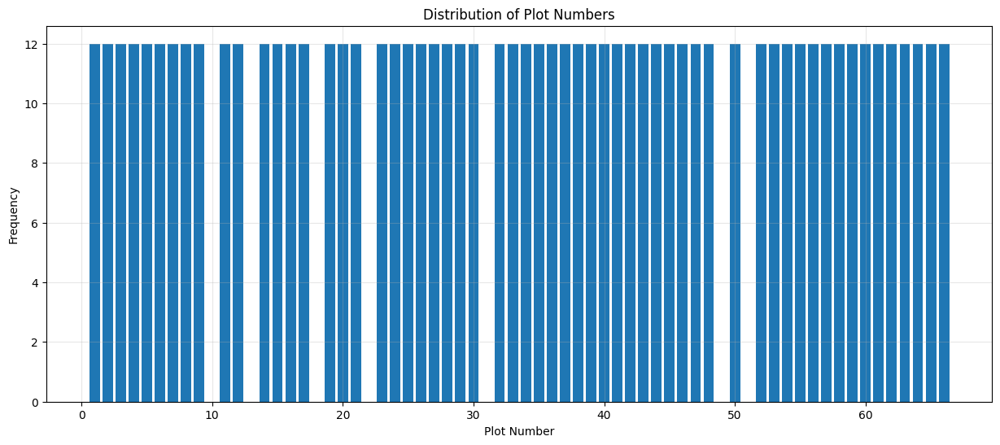

In [93]:
def analyze_patch_distribution():
    base_path = Path('../Datasets/Testing/Tiles')
    patch_counts = Counter()
    
    # Count patches
    for tile_dir in base_path.glob('S2*'):
        # First, look for base plot names (without _P suffix)
        for patch_file in tile_dir.rglob('*.npy'):
            plot_name = patch_file.stem  # Get filename without extension
            if '_P' not in plot_name:  # This is a single patch plot
                plot_num = int(plot_name.split('-')[1])  # Extract number from PLOT-XXXXX
                patch_counts[plot_num] += 1
            else:  # This is a multi-patch plot
                plot_num = int(plot_name.split('-')[1].split('_')[0])  # Extract number before _P
                patch_counts[plot_num] += 1
    
    # Prepare data for plotting
    patch_numbers = sorted(patch_counts.keys())
    frequencies = [patch_counts[i] for i in patch_numbers]
    
    # Create histogram
    plt.figure(figsize=(15, 6))
    plt.bar(patch_numbers, frequencies)
    plt.title('Distribution of Plot Numbers')
    plt.xlabel('Plot Number')
    plt.ylabel('Frequency')
    plt.grid(True, alpha=0.3)
    
    # Print statistics
    total_patches = sum(frequencies)
    print(f"Total patches: {total_patches}")
    print(f"\nMost common plot files:")
    
    # Print sorted plot information with proper formatting
    most_common = sorted(patch_counts.items(), key=lambda x: x[1], reverse=True)
    for num, freq in most_common[:5]:
        plot_base = f"PLOT-{str(num).zfill(5)}"  # Format: PLOT-00001
        percentage = (freq / total_patches) * 100
        print(f"{plot_base:<15} {freq:>5} occurrences ({percentage:>6.2f}%)")
        
        # Also list any multi-patch variants
        multi_patches = list(base_path.rglob(f'*/{plot_base}_P*.npy'))
        if multi_patches:
            print("  Multi-patches found:")
            for patch in sorted(multi_patches):
                print(f"    {patch.stem}")
    
    plt.show()
    
    return patch_counts

# Run analysis
distribution = analyze_patch_distribution()